<a href="https://colab.research.google.com/github/OlegBEZb/assesment_preparation/blob/main/Bank%20marketing%20dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%%capture

!pip install pandas-profiling -U
!pip install MarkupSafe==2.0.1
!pip install category_encoders

In [2]:
import sklearn
import category_encoders as ce

from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
%matplotlib inline

import numpy as np
import pandas as pd
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


The dataset [description](http://archive.ics.uci.edu/ml/datasets/Bank+Marketing).   
[First paper of 2011](https://core.ac.uk/download/pdf/55616194.pdf).   
[Second paper of 2014](https://core.ac.uk/download/pdf/55631291.pdf)

In [3]:
df = pd.read_csv('/content/bank_marketing_campaign.csv')
df.head()

,age,job,marital,education,default,housing,loan,balance,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,423.0,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,2868.0,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,1888.0,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,1113.0,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,451.0,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [4]:
df.shape

(41188, 22)

The task is valuable to assist managers in prioritizing and selecting the next customers to be contacted during bank
marketing campaigns.

In [5]:
target_col = 'y'

# EDA and Preprocessing

In [6]:
df.index.is_monotonic

True

In [7]:
df.rename(columns={'month': 'last_contact_month',
                   'contact': 'last_communication_type',
                   'day_of_week': 'last_contact_day_of_week',
                   'default': 'has_credit',
                   'housing': 'has_housing_loan',
                   'loan': 'has_personal_loan'}, inplace=True)

CAT_FEATURES = ['job', 'marital', 'education',
                'has_credit', 'has_housing_loan', 'has_personal_loan',
                'last_communication_type', 'last_contact_month', 
                'last_contact_day_of_week', 'poutcome']

## Profiling

In [ ]:
from pandas_profiling import ProfileReport

In [ ]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]


1.   Age is positively correlated with balance (that is happy to know)
2.   List item



In [8]:
df[target_col].value_counts(normalize=True)

no     0.887346
yes    0.112654
Name: y, dtype: float64

## Drop duplicates

In [9]:
df[df.duplicated(keep=False)]

,age,job,marital,education,has_credit,has_housing_loan,has_personal_loan,balance,last_communication_type,last_contact_month,last_contact_day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
1265,39,blue-collar,married,basic.6y,no,no,no,909.0,telephone,may,thu,124,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
1266,39,blue-collar,married,basic.6y,no,no,no,909.0,telephone,may,thu,124,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
12260,36,retired,married,unknown,no,no,no,3520.0,telephone,jul,thu,88,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
12261,36,retired,married,unknown,no,no,no,3520.0,telephone,jul,thu,88,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
14155,27,technician,single,professional.course,no,no,no,5778.0,cellular,jul,mon,331,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
14234,27,technician,single,professional.course,no,no,no,5778.0,cellular,jul,mon,331,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16819,47,technician,divorced,high.school,no,yes,no,950.0,cellular,jul,thu,43,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16956,47,technician,divorced,high.school,no,yes,no,950.0,cellular,jul,thu,43,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
18464,32,technician,single,professional.course,no,yes,no,1889.0,cellular,jul,thu,128,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no
18465,32,technician,single,professional.course,no,yes,no,1889.0,cellular,jul,thu,128,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no


Thanks to pandas profiling, we founs several rows completely duplicates. There is no need to keep them

In [10]:
df.drop_duplicates(inplace=True)
df.shape

(41176, 22)

In [11]:
assert df[df.duplicated(keep=False)].empty

## Missing values handling

From the description we know that some of the missing values were replaced with specific values

In [12]:
df.isna().any(axis=0)

age                         False
job                         False
marital                     False
education                   False
has_credit                  False
has_housing_loan            False
has_personal_loan           False
balance                     False
last_communication_type     False
last_contact_month          False
last_contact_day_of_week    False
duration                    False
campaign                    False
pdays                       False
previous                    False
poutcome                    False
emp.var.rate                False
cons.price.idx              False
cons.conf.idx               False
euribor3m                   False
nr.employed                 False
y                           False
dtype: bool

Usual nans are not presented. All existing nans are encoded into specific value

For *job, marital, education, default, housing, loan* columns the value unknown is fair and very difficult to predict. Moreover, unknown value sometimes is important on its own, for example, if the user doesn't want to share this information (regardless if it was asked or scraped).

pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted). 

Let us check how severe is this problem

In [13]:
len(df[df['pdays'] == 999]) / len(df)

0.9632067223625412

Most of the users were not contacted before. We are going to split this column

In [14]:
df['contacted_before'] = df['pdays'] == 999
df['contacted_before'] = df['contacted_before'].map({True: 1, False: 0})
df.loc[df['pdays'] == 999, 'pdays'] = np.nan

In [15]:
df['contacted_before'].value_counts()

1    39661
0     1515
Name: contacted_before, dtype: int64

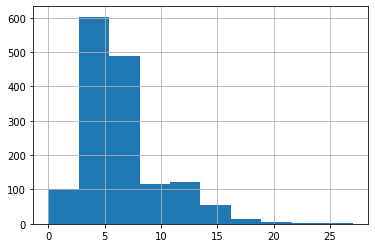

In [16]:
df['pdays'].hist()

## Feature engineering non-dependent on time

In [17]:
df['contacts_diff'] = df['campaign'] - df['previous']
df['poutcome_weighted'] = df['poutcome'].map({'failure': -1,
                                              'nonexistent': 0, 
                                              'success': 1}) * df['pdays']
df['contacts_per_conclusion'] = df['poutcome'].map({'failure': -1, 
                                                    'nonexistent': 0, 
                                                    'success': 1}) / (df['previous'] + 1e-6)

df['balance_log10'] = np.log(df['balance'] + 1e-6) / np.log(10)                                               

/usr/local/lib/python3.7/dist-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


## Train-val-test split

According to the description, the data is "ordered by date (from May 2008 to November 2010)". This doesn't let us shuffle the data. 

But in the [first paper of 2011](https://core.ac.uk/download/pdf/55616194.pdf) "the whole dataset
was randomly divided into training (2/3) and test (1/3)
sets".   

In the [second paper of 2014](https://core.ac.uk/download/pdf/55631291.pdf) it was fixed: "For evaluation purposes, a time ordered split was initially performed, where the records were divided into training (four years)
and test data (one year). The training data is used for feature and model
selection and includes all contacts executed up to June 2012, in a total of
51,651 examples. The test data is used for measuring the prediction capabilities of the selected data-driven model, including the most recent
1293 contacts, from July 2012 to June 2013."

In [18]:
df['last_contact_month'].value_counts()

may    13767
jul     7169
aug     6176
jun     5318
nov     4100
apr     2631
oct      717
sep      570
mar      546
dec      182
Name: last_contact_month, dtype: int64

In [19]:
df['last_contact_month'] = df['last_contact_month'].map({'jan': 0,
                                                         'feb': 1,
                                                         'mar': 2,
                                                         'apr': 3,
                                                         'may': 4,
                                                         'jun': 5,
                                                         'jul': 6,
                                                         'aug': 7,
                                                         'sep': 8,
                                                         'oct': 9,
                                                         'nov': 10,
                                                         'dec': 11})

In [20]:
def collapse_sequences(ls):
    output_ls = []
    for elem in ls:
        if elem not in output_ls:
            output_ls.append(elem)
        else: # if this element already in the output list
            if output_ls[-1] != elem: # we check that this is a new sequence of this value
                output_ls.append(elem)
    return output_ls

In [21]:
print(collapse_sequences(df['last_contact_month'].values))

[4, 5, 6, 7, 9, 10, 11, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 2, 3, 4, 5, 6, 7, 8, 9, 10]


here we easily see 2.5 years. We never have anything in Jan, Feb

In [22]:
last_year_day_index = df[(df['last_contact_month'] == 11) & ((df['last_contact_month'].shift(-1) == 2))].index
df.loc[last_year_day_index]

,age,job,marital,education,has_credit,has_housing_loan,has_personal_loan,balance,last_communication_type,last_contact_month,last_contact_day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,contacted_before,contacts_diff,poutcome_weighted,contacts_per_conclusion,balance_log10
27689,44,blue-collar,married,basic.4y,no,yes,yes,635.0,telephone,11,mon,119,1,NaN,0,nonexistent,-0.2,92.756,-45.9,3.053,5176.3,yes,1,1,NaN,0.000000,2.802774
39129,59,management,married,university.degree,no,yes,no,1358.0,cellular,11,thu,646,3,6.0,1,success,-3.0,92.713,-33.0,0.700,5023.5,no,0,2,6.0,0.999999,3.132900


In [23]:
df.loc[:last_year_day_index[0], 'last_contact_year'] = 2008
df.loc[last_year_day_index[0]+1: last_year_day_index[1], 'last_contact_year'] = 2009
df.loc[last_year_day_index[1]+1:, 'last_contact_year'] = 2010
df['last_contact_year'] = df['last_contact_year'].astype(int)

This may be shifted one year back as it's the prev campaign

In [24]:
df['year_mon'] = df[['last_contact_year', 'last_contact_month']].apply(lambda x: str(x['last_contact_year']) + '_' + str(x['last_contact_month']).zfill(2), axis=1)
df['year_mon']

0        2008_04
1        2008_04
2        2008_04
3        2008_04
4        2008_04
          ...   
41183    2010_10
41184    2010_10
41185    2010_10
41186    2010_10
41187    2010_10
Name: year_mon, Length: 41176, dtype: object

In [25]:
year_mon_list = df['year_mon'].unique()
values = [df[df['year_mon'] == year_mon][target_col].value_counts(normalize=True).values for year_mon in year_mon_list]
label_distribs = np.array(values)
label_distribs.shape

(26, 2)

In [26]:
def plot_value_counts(distribs, xticks_list=['Train', 'Val', 'Test'], size=(15, 6)):
    x = np.arange(distribs.shape[0])
    width = 0.2
    
    y0 = distribs[:, 0]
    y1 = distribs[:, 1]

    plt.figure(figsize=size)
    plt.bar(x-0.2, y0, width, color='tab:blue')
    plt.bar(x, y1, width, color='tab:red')
    plt.xticks(x, xticks_list, rotation=45)
    plt.xlabel("Folds")
    plt.ylabel("Ratio")
    plt.legend(["deposit: no", "deposit: yes"])
    plt.title('Labed distriburion per fold')
    plt.show()

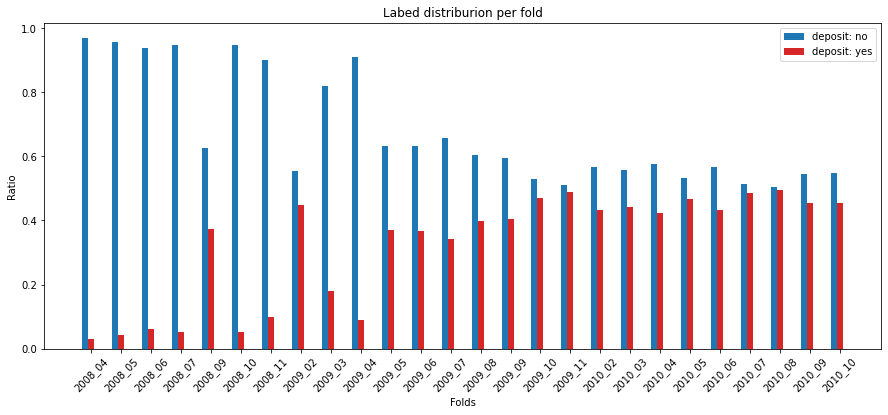

In [27]:
plot_value_counts(label_distribs, xticks_list=year_mon_list, size=(15, 6))

For the fair time-series split (which is essential) this is a very bad sign. The balance of the dataset changes along the timeline. This will not be such severe if we split with shuffle but it's unfair

In [28]:
enc = ce.OrdinalEncoder(cols=['year_mon'])
df = enc.fit_transform(df)
df.rename(columns={"year_mon": "year_mon_ordinal"}, inplace=True)
CAT_FEATURES.append('year_mon_ordinal')
df.head()

,age,job,marital,education,has_credit,has_housing_loan,has_personal_loan,balance,last_communication_type,last_contact_month,last_contact_day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,contacted_before,contacts_diff,poutcome_weighted,contacts_per_conclusion,balance_log10,last_contact_year,year_mon_ordinal
0,56,housemaid,married,basic.4y,no,no,no,423.0,telephone,4,mon,261,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,1,1,NaN,0.0,2.626340,2008,1
1,57,services,married,high.school,unknown,no,no,2868.0,telephone,4,mon,149,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,1,1,NaN,0.0,3.457579,2008,1
2,37,services,married,high.school,no,yes,no,1888.0,telephone,4,mon,226,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,1,1,NaN,0.0,3.276002,2008,1
3,40,admin.,married,basic.6y,no,no,no,1113.0,telephone,4,mon,151,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,1,1,NaN,0.0,3.046495,2008,1
4,56,services,married,high.school,no,no,yes,451.0,telephone,4,mon,307,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,1,1,NaN,0.0,2.654177,2008,1


In [29]:
print(collapse_sequences(df['last_contact_day_of_week']))

['mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'wed', 'thu', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'wed', 'thu', 'fri', 'mon', 'wed', 'thu', 'fri', 'mon', 'tue', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue'

Analysing the distribution over the days, it will be possible to fill the original dates. This gives a very deep opportinity to calculate various time-related features

11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.

In [121]:
cols_to_drop = ['duration']

Within a campaign, the human agents execute phone calls to a list of clients to sell the deposit (outbound) or, if
meanwhile the client calls the contact-center for any other reason, he
is asked to subscribe the deposit (inbound). Thus, the result is a binary
unsuccessful or successful contact.

In [123]:
y = df[target_col].map({'no': 0, 'yes': 1})
X = df.drop([target_col] + cols_to_drop, axis=1)
X.shape, y.shape

((41176, 27), (41176,))

In [124]:
y.value_counts()

0    36537
1     4639
Name: y, dtype: int64

In [125]:
y.value_counts(normalize=True)

0    0.887337
1    0.112663
Name: y, dtype: float64

Very similar to the values stated in https://core.ac.uk/download/pdf/55616194.pdf

We do such a split without grouping into months as we rely on the sorting

In [126]:
from sklearn.model_selection import train_test_split

X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.10, shuffle=False)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, 
                                                  test_size=len(y_test)*3, # needed for rebalancing
                                                  shuffle=False)

X_train.shape, X_val.shape, X_test.shape

((24704, 27), (12354, 27), (4118, 27))

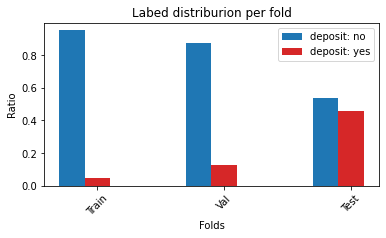

In [128]:
values = [df.value_counts(normalize=True).values for df in [y_train, y_val, y_test]]
label_distribs = np.array(values)

plot_value_counts(label_distribs, size=(6, 3))

In [129]:
y_val.value_counts()

0    10795
1     1559
Name: y, dtype: int64

In [130]:
neg2pos_test_ratio = len(y_test[y_test == 0]) / len(y_test[y_test == 1])
neg2pos_test_ratio

1.1765327695560253

In [131]:
y_val_keep = y_val[y_val == 0].sample(int(neg2pos_test_ratio*len(y_val[y_val == 1])))
y_val = y_val.loc[(y_val_keep.index).union(y_val[y_val==1].index)]
X_val = X_val.loc[y_val.index]

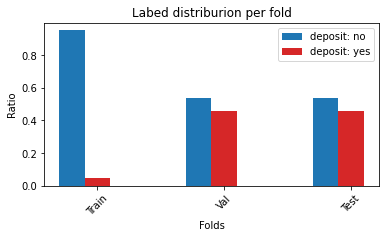

In [132]:
values = [fold_df.value_counts(normalize=True).values for fold_df in [y_train, y_val, y_test]]
label_distribs = np.array(values)
plot_value_counts(label_distribs, size=(6, 3))

Now we can evaluate our algorithms in a bit more stable manner

In [133]:
[fold_df.value_counts(normalize=False).values for fold_df in [y_train, y_val, y_test]]

[array([23516,  1188]), array([1834, 1559]), array([2226, 1892])]

In [134]:
assert X_train.index.is_monotonic_increasing
assert X_val.index.is_monotonic_increasing
assert X_test.index.is_monotonic_increasing

In [135]:
assert X_train.index.intersection(X_val.index).empty
assert X_train.index.intersection(X_test.index).empty
assert X_val.index.intersection(X_test.index).empty

In [136]:
X_train.shape, X_val.shape, X_test.shape

((24704, 27), (3393, 27), (4118, 27))

## Features preparation for different models

In [137]:
nan_cols = X_train.columns[X_train.isna().any(axis=0)].tolist()
nan_cols

['pdays', 'poutcome_weighted', 'balance_log10']

In [138]:
# Create correlation matrix
corr_matrix = X_train.corr()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
upper.style.background_gradient(cmap='coolwarm')

/usr/local/lib/python3.7/dist-packages/pandas/io/formats/style.py:2813: RuntimeWarning: All-NaN slice encountered
  smin = np.nanmin(gmap) if vmin is None else vmin
/usr/local/lib/python3.7/dist-packages/pandas/io/formats/style.py:2814: RuntimeWarning: All-NaN slice encountered
  smax = np.nanmax(gmap) if vmax is None else vmax


,age,balance,last_contact_month,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,contacted_before,contacts_diff,poutcome_weighted,contacts_per_conclusion,balance_log10,last_contact_year,year_mon_ordinal
age,nan,0.151468,0.028111,0.010459,-0.698961,0.015908,-0.038338,-0.045104,0.068196,-0.042844,-0.021614,-0.001096,0.010099,-0.698961,-0.015429,0.182225,nan,0.025309
balance,nan,nan,0.009780,-0.006338,-0.841124,0.022547,-0.022923,-0.011893,0.019771,-0.025991,-0.012169,-0.025759,-0.006829,-0.841124,-0.011446,0.820569,nan,0.007566
last_contact_month,nan,nan,nan,-0.005855,nan,0.238702,-0.127445,-0.689711,-0.225604,-0.205045,0.572197,-0.051329,-0.011102,nan,-0.216492,0.005443,nan,0.994028
campaign,nan,nan,nan,nan,0.125000,-0.032051,0.114433,0.062551,-0.079411,0.100351,0.102536,0.007404,0.999758,0.125000,0.028849,-0.002516,nan,0.004350
pdays,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.790569,nan,nan,0.125000,1.000000,nan,-0.910503,nan,nan
previous,nan,nan,nan,nan,nan,nan,-0.363357,-0.152278,-0.067668,-0.406488,-0.082206,-0.214294,-0.054028,nan,-0.907270,0.020861,nan,0.199349
emp.var.rate,nan,nan,nan,nan,nan,nan,nan,0.235923,-0.172703,0.925817,0.665470,0.077865,0.122321,nan,0.329663,-0.014135,nan,-0.022817
cons.price.idx,nan,nan,nan,nan,nan,nan,nan,nan,-0.426958,0.200589,-0.040267,0.033055,0.065843,nan,0.137976,-0.010517,nan,-0.691669
cons.conf.idx,nan,nan,nan,nan,nan,nan,nan,nan,nan,-0.047868,-0.559713,0.014628,-0.077847,nan,0.061339,0.026509,nan,-0.220597
euribor3m,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.519970,0.087312,0.109201,0.790569,0.368706,-0.016816,nan,-0.105440


In [139]:
def get_corr(df):
    c = df.corr(method='pearson').abs()
    s = c.unstack()
    s = s[s.index.get_level_values(0) != s.index.get_level_values(1)]
    so = s.sort_values(ascending=False)
    so = so[~so.isna()]
    return so

train_corrs = get_corr(X_train)
print(train_corrs[train_corrs > 0.8])

poutcome_weighted        pdays                      1.000000
pdays                    poutcome_weighted          1.000000
contacts_diff            campaign                   0.999758
campaign                 contacts_diff              0.999758
last_contact_month       year_mon_ordinal           0.994028
year_mon_ordinal         last_contact_month         0.994028
emp.var.rate             euribor3m                  0.925817
euribor3m                emp.var.rate               0.925817
pdays                    balance_log10              0.910503
balance_log10            pdays                      0.910503
poutcome_weighted        balance_log10              0.910503
balance_log10            poutcome_weighted          0.910503
contacts_per_conclusion  previous                   0.907270
previous                 contacts_per_conclusion    0.907270
poutcome_weighted        balance                    0.841124
pdays                    balance                    0.841124
balance                 

In [140]:
# Find features with correlation greater than threshold
corr_cols = [
             'campaign', 
             'last_contact_month', 
             'emp.var.rate',
             'previous'
             ]
train_corrs = get_corr(X_train.drop(corr_cols + nan_cols, axis=1))
print(train_corrs[train_corrs > 0.7])

Series([], dtype: float64)


In [162]:
enc = ce.OneHotEncoder(cols=[f for f in CAT_FEATURES if f not in nan_cols+corr_cols], 
                       use_cat_names=True)

X_train_val_enc = enc.fit_transform(X_train_val.drop(nan_cols+corr_cols, axis=1))
X_test_enc_based_on_train_val = enc.transform(X_test.drop(nan_cols+corr_cols, axis=1))
X_test_enc_based_on_train_val.head()

,age,job_housemaid,job_services,job_admin.,job_blue-collar,job_technician,job_retired,job_management,job_unemployed,job_self-employed,job_unknown,job_entrepreneur,job_student,marital_married,marital_single,marital_divorced,marital_unknown,education_basic.4y,education_high.school,education_basic.6y,education_basic.9y,education_professional.course,education_unknown,education_university.degree,education_illiterate,has_credit_no,has_credit_unknown,has_credit_yes,has_housing_loan_no,has_housing_loan_yes,has_housing_loan_unknown,has_personal_loan_no,has_personal_loan_yes,has_personal_loan_unknown,balance,last_communication_type_telephone,last_communication_type_cellular,last_contact_day_of_week_mon,last_contact_day_of_week_tue,last_contact_day_of_week_wed,last_contact_day_of_week_thu,last_contact_day_of_week_fri,poutcome_nonexistent,poutcome_failure,poutcome_success,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,contacted_before,contacts_diff,contacts_per_conclusion,last_contact_year,year_mon_ordinal_1.0,year_mon_ordinal_2.0,year_mon_ordinal_3.0,year_mon_ordinal_4.0,year_mon_ordinal_5.0,year_mon_ordinal_6.0,year_mon_ordinal_7.0,year_mon_ordinal_8.0,year_mon_ordinal_9.0,year_mon_ordinal_10.0,year_mon_ordinal_11.0,year_mon_ordinal_12.0
37069,59,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1128.0,0,1,0,0,1,0,0,1,0,0,92.469,-33.6,1.029,5076.2,1,2,0.000000,2009,0,0,0,0,0,0,0,0,0,0,0,1
37070,40,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,440.0,0,1,0,0,1,0,0,0,0,1,92.469,-33.6,1.029,5076.2,0,2,0.999999,2009,0,0,0,0,0,0,0,0,0,0,0,1
37071,26,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,1,0,0,2530.0,0,1,0,0,1,0,0,1,0,0,92.469,-33.6,1.029,5076.2,1,1,0.000000,2009,0,0,0,0,0,0,0,0,0,0,0,1
37072,36,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1955.0,0,1,0,0,1,0,0,1,0,0,92.469,-33.6,1.029,5076.2,1,3,0.000000,2009,0,0,0,0,0,0,0,0,0,0,0,1
37073,32,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,1,0,0,403.0,0,1,0,0,1,0,0,1,0,0,92.469,-33.6,1.029,5076.2,1,3,0.000000,2009,0,0,0,0,0,0,0,0,0,0,0,1


In [163]:
X_train_enc = enc.fit_transform(X_train.drop(nan_cols+corr_cols, axis=1))
X_val_enc_based_on_train = enc.transform(X_val.drop(nan_cols+corr_cols, axis=1))
X_test_enc_based_on_train = enc.transform(X_test.drop(nan_cols+corr_cols, axis=1))
X_test_enc_based_on_train.head()

,age,job_housemaid,job_services,job_admin.,job_blue-collar,job_technician,job_retired,job_management,job_unemployed,job_self-employed,job_unknown,job_entrepreneur,job_student,marital_married,marital_single,marital_divorced,marital_unknown,education_basic.4y,education_high.school,education_basic.6y,education_basic.9y,education_professional.course,education_unknown,education_university.degree,education_illiterate,has_credit_no,has_credit_unknown,has_credit_yes,has_housing_loan_no,has_housing_loan_yes,has_housing_loan_unknown,has_personal_loan_no,has_personal_loan_yes,has_personal_loan_unknown,balance,last_communication_type_telephone,last_communication_type_cellular,last_contact_day_of_week_mon,last_contact_day_of_week_tue,last_contact_day_of_week_wed,last_contact_day_of_week_thu,last_contact_day_of_week_fri,poutcome_nonexistent,poutcome_failure,poutcome_success,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,contacted_before,contacts_diff,contacts_per_conclusion,last_contact_year,year_mon_ordinal_1.0,year_mon_ordinal_2.0,year_mon_ordinal_3.0,year_mon_ordinal_4.0,year_mon_ordinal_5.0,year_mon_ordinal_6.0
37069,59,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1128.0,0,1,0,0,1,0,0,1,0,0,92.469,-33.6,1.029,5076.2,1,2,0.000000,2009,0,0,0,0,0,0
37070,40,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,440.0,0,1,0,0,1,0,0,0,0,1,92.469,-33.6,1.029,5076.2,0,2,0.999999,2009,0,0,0,0,0,0
37071,26,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,1,0,0,2530.0,0,1,0,0,1,0,0,1,0,0,92.469,-33.6,1.029,5076.2,1,1,0.000000,2009,0,0,0,0,0,0
37072,36,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1955.0,0,1,0,0,1,0,0,1,0,0,92.469,-33.6,1.029,5076.2,1,3,0.000000,2009,0,0,0,0,0,0
37073,32,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,1,0,0,403.0,0,1,0,0,1,0,0,1,0,0,92.469,-33.6,1.029,5076.2,1,3,0.000000,2009,0,0,0,0,0,0


# Evaluation

Selecting between F1, ROC AUC, and PR AUC.  

The dataset is heavily imbalanced we mostly mostly care about the positive class -> ROC AUC is rejected.  The additional reason to go with F1 (or Fbeta) is that these metrics are easier to interpret and communicate to business stakeholders.  

To provide some sort of comparison with the original papers, ROC AUC may be included but not treated as target metric

In [164]:
def eval(y_test, y_pred):
    clf_report = classification_report(y_test, y_pred, zero_division=0)

    print(clf_report)

    conf_matrix = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(conf_matrix, display_labels=np.unique(y_test))
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.grid(False)
    disp.plot(ax=ax)

In [165]:
from sklearn.metrics import roc_auc_score

# Modeling

## Baselines

### Majority baseline

              precision    recall  f1-score   support

           0       0.54      1.00      0.70      2226
           1       0.00      0.00      0.00      1892

    accuracy                           0.54      4118
   macro avg       0.27      0.50      0.35      4118
weighted avg       0.29      0.54      0.38      4118



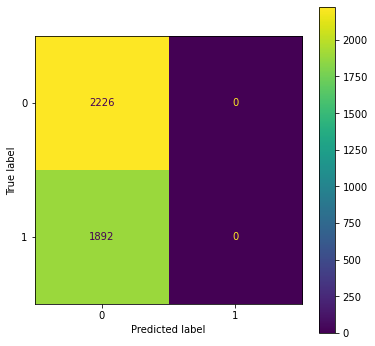

In [231]:
test_majority_preds = [0] * len(y_test)
eval(y_test, test_majority_preds)

In [271]:
roc_auc_score(y_test, test_majority_preds)

0.5

## Minority baseline

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      2226
           1       0.46      1.00      0.63      1892

    accuracy                           0.46      4118
   macro avg       0.23      0.50      0.31      4118
weighted avg       0.21      0.46      0.29      4118



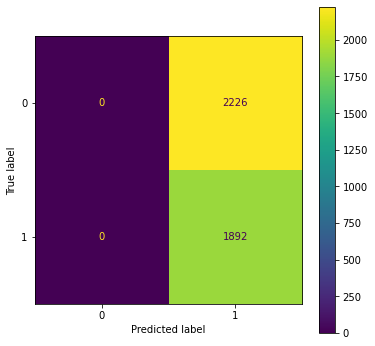

In [269]:
test_minority_preds = [1] * len(y_test)
eval(y_test, test_minority_preds)

In [270]:
roc_auc_score(y_test, test_minority_preds)

0.5

### Random baseline

              precision    recall  f1-score   support

           0       0.54      0.49      0.51      2226
           1       0.46      0.51      0.48      1892

    accuracy                           0.49      4118
   macro avg       0.50      0.50      0.49      4118
weighted avg       0.50      0.49      0.50      4118



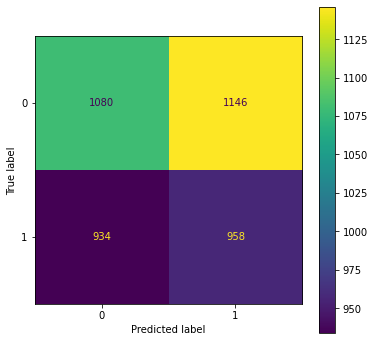

In [234]:
test_random_preds = np.random.choice([0, 1], size=len(y_test))
eval(y_test, test_random_preds)

In [235]:
roc_auc_score(y_test, np.random.choice([0, 1], size=len(y_test)))

0.48526732883907087

## Log reg with dummy features

              precision    recall  f1-score   support

           0       0.54      1.00      0.70      1834
           1       0.00      0.00      0.00      1559

    accuracy                           0.54      3393
   macro avg       0.27      0.50      0.35      3393
weighted avg       0.29      0.54      0.38      3393



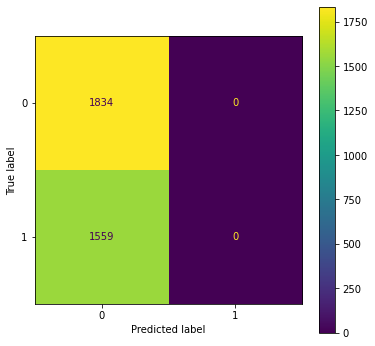

In [173]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

log_reg_baseline = make_pipeline(StandardScaler(), LogisticRegression(max_iter=1000))
log_reg_baseline.fit(X_train_enc, y_train)
eval(y_val, log_reg_baseline.predict(X_val_enc_based_on_train))

              precision    recall  f1-score   support

           0       0.56      0.98      0.71      2226
           1       0.80      0.08      0.15      1892

    accuracy                           0.57      4118
   macro avg       0.68      0.53      0.43      4118
weighted avg       0.67      0.57      0.46      4118



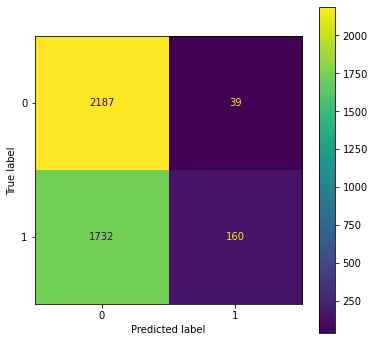

In [174]:
log_reg_baseline = make_pipeline(StandardScaler(), LogisticRegression(max_iter=1000))
log_reg_baseline.fit(X_train_val_enc, y_train_val)
test_log_reg_preds = log_reg_baseline.predict(X_test_enc_based_on_train_val)
eval(y_test, test_log_reg_preds)

In [175]:
roc_auc_score(y_test, log_reg_baseline.predict_proba(X_test_enc_based_on_train_val)[:, 1])

0.6804959977129789

In [176]:
importance = log_reg_baseline.steps[-1][-1].coef_[0]
pd.DataFrame({'feature': X_train_val_enc.columns, 'importance': importance}).sort_values('importance', 
                                                                                         ascending=False).head(10)

,feature,importance
63,year_mon_ordinal_11.0,0.210985
47,euribor3m,0.185886
52,last_contact_year,0.161942
61,year_mon_ordinal_9.0,0.151400
57,year_mon_ordinal_5.0,0.146003
60,year_mon_ordinal_8.0,0.144062
42,poutcome_nonexistent,0.131467
64,year_mon_ordinal_12.0,0.107329
36,last_communication_type_cellular,0.098487
44,poutcome_success,0.093915


## Decision tree with dummy features

              precision    recall  f1-score   support

           0       0.95      1.00      0.98     23516
           1       0.88      0.03      0.06      1188

    accuracy                           0.95     24704
   macro avg       0.91      0.51      0.52     24704
weighted avg       0.95      0.95      0.93     24704

              precision    recall  f1-score   support

           0       0.54      1.00      0.70      1834
           1       0.22      0.00      0.00      1559

    accuracy                           0.54      3393
   macro avg       0.38      0.50      0.35      3393
weighted avg       0.39      0.54      0.38      3393



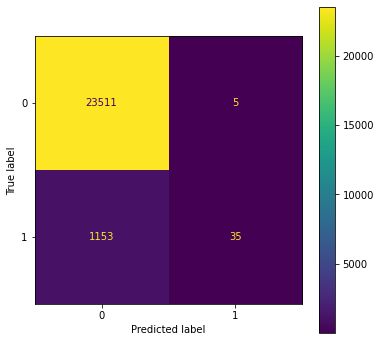

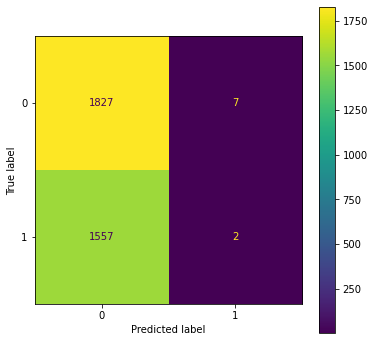

In [179]:
from sklearn.tree import DecisionTreeClassifier

tree_clf = DecisionTreeClassifier(max_depth=4).fit(X_train_enc, y_train)
eval(y_train, tree_clf.predict(X_train_enc))
eval(y_val, tree_clf.predict(X_val_enc_based_on_train))

              precision    recall  f1-score   support

           0       0.59      0.89      0.71      2226
           1       0.68      0.28      0.40      1892

    accuracy                           0.61      4118
   macro avg       0.64      0.58      0.55      4118
weighted avg       0.63      0.61      0.57      4118



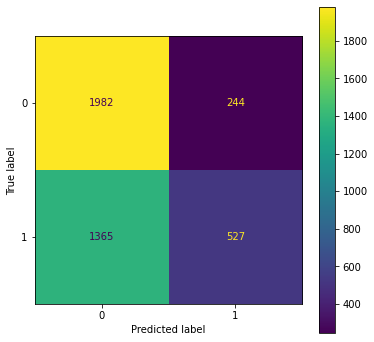

In [180]:
tree_clf = DecisionTreeClassifier(max_depth=4).fit(X_train_val_enc, y_train_val)
test_tree_preds = tree_clf.predict(X_test_enc_based_on_train_val)
eval(y_test, test_tree_preds)

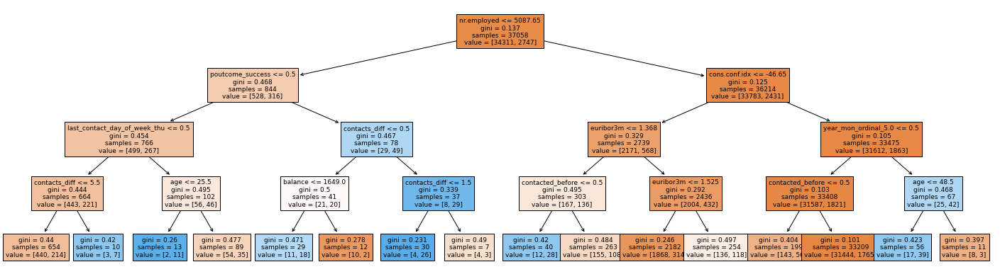

In [181]:
from sklearn.tree import DecisionTreeClassifier
from matplotlib import pyplot as plt

fig, axes = plt.subplots(nrows=1,
                        ncols=1,
                        figsize=(25, 7))

from sklearn import tree
tree.plot_tree(tree_clf, 
               feature_names=X_test_enc_based_on_train_val.columns, 
            #    class_names=automl.classes_
                filled=True,
                max_depth=4,
                fontsize=9,
                );

## CatBoost

In [182]:
%%capture
!pip install catboost

In [183]:
import catboost
from catboost import CatBoostClassifier, Pool

In [186]:
train_pool = Pool(data=X_train, 
                  label=y_train,
                  cat_features=CAT_FEATURES,
                  )

val_pool = Pool(data=X_val, 
                  label=y_val,
                  cat_features=CAT_FEATURES,
                  )

train_val_pool = Pool(data=pd.concat([X_train, X_val], axis=0),
                      label=pd.concat([y_train, y_val], axis=0),
                      cat_features=CAT_FEATURES,
                      )

test_pool = Pool(data=X_test, 
                  label=y_test,
                  cat_features=CAT_FEATURES,
                  )

In [246]:
params = {
    'iterations': 100,
    'custom_metric': ['F1'], 
    'early_stopping_rounds': 10,
    'use_best_model': True,
    'metric_period': 10,
    'auto_class_weights': 'Balanced',
    # 'class_weights': [1, 10],
    'has_time': True,
}

model = CatBoostClassifier(**params)
model.fit(train_pool, eval_set=val_pool, plot=False, verbose_eval=True)

Learning rate set to 0.190512
0:	learn: 0.6841326	test: 0.6912520	best: 0.6912520 (0)	total: 38.2ms	remaining: 3.78s


10:	learn: 0.6644084	test: 0.6932230	best: 0.6274312 (2)	total: 459ms	remaining: 3.71s
Stopped by overfitting detector  (10 iterations wait)

bestTest = 0.6274312143
bestIteration = 2

Shrink model to first 3 iterations.


In [247]:
params['iterations'] = max(model.best_iteration_, 1)
del params['use_best_model']
model = CatBoostClassifier(**params)
model.fit(train_val_pool, plot=False, verbose_eval=True)

Learning rate set to 0.5
0:	learn: 0.5621331	total: 64.2ms	remaining: 64.2ms
1:	learn: 0.5310109	total: 94.6ms	remaining: 0us


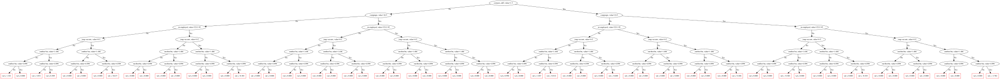

In [248]:
model.plot_tree(
    tree_idx=0,
    pool=val_pool
)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      2226
           1       0.46      1.00      0.63      1892

    accuracy                           0.46      4118
   macro avg       0.23      0.50      0.31      4118
weighted avg       0.21      0.46      0.29      4118



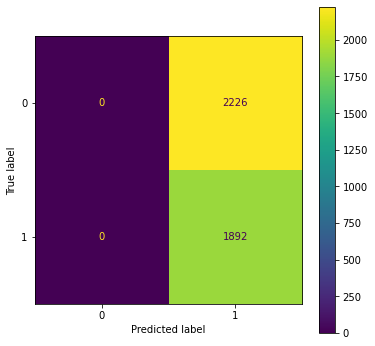

In [249]:
test_catboost_preds = model.predict(test_pool)
eval(y_test, test_catboost_preds)

In [250]:
roc_auc_score(y_test, model.predict_proba(test_pool)[:, 1])

0.4724414188268949

### SHAP importances

In [209]:
%%capture
!pip install shap

In [210]:
import shap
shap.initjs()

explainer = shap.Explainer(model)
shap_values = explainer(X_test)

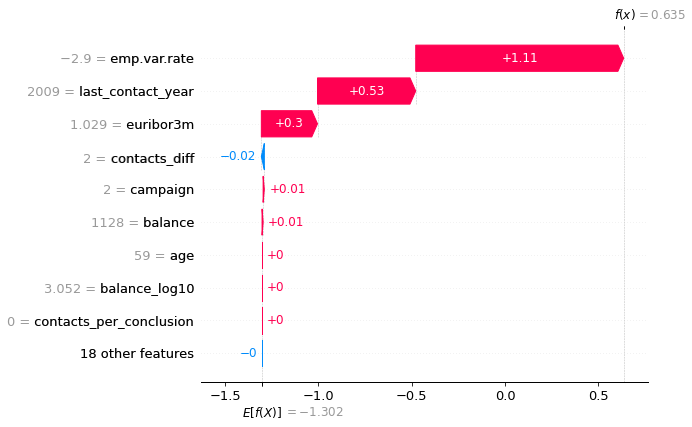

In [211]:
shap.plots.waterfall(shap_values[0])

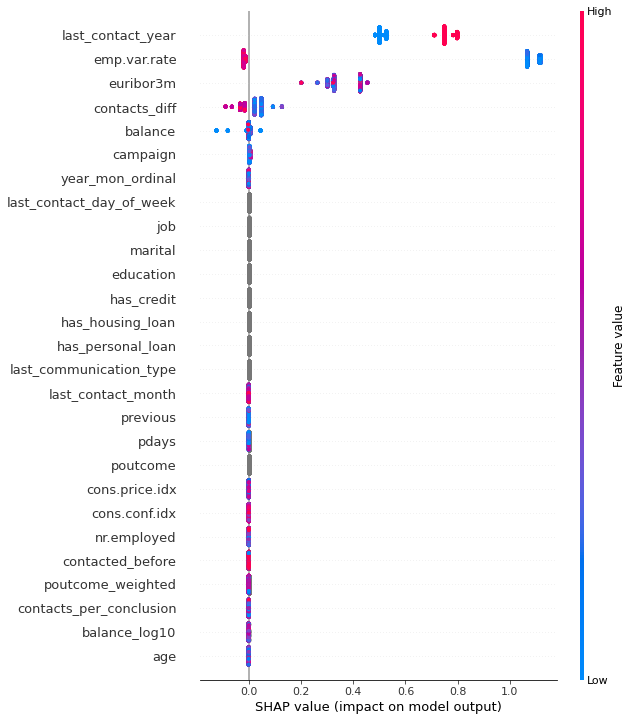

In [212]:
# summarize the effects of all the features
shap.plots.beeswarm(shap_values, max_display=50)

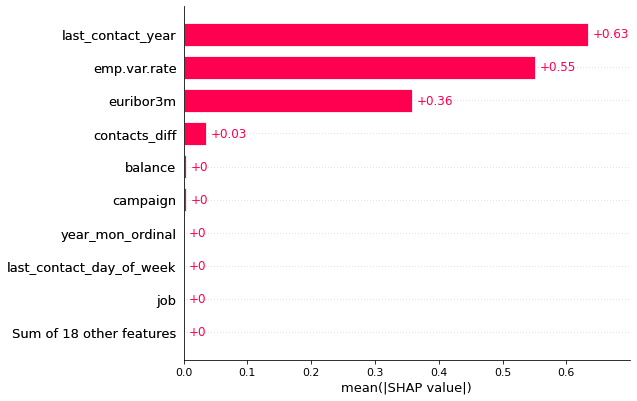

In [213]:
shap.plots.bar(shap_values, max_display=10)

# Results

In [251]:
X_test['preds_catboost'] = test_catboost_preds
X_test['preds_logreg'] = test_log_reg_preds
X_test['preds_tree'] = test_tree_preds
X_test['preds_majority'] = test_majority_preds
X_test['preds_random'] = test_random_preds
X_test['ground_truth'] = y_test

In [215]:
X_test['ground_truth'].value_counts()

0    2226
1    1892
Name: ground_truth, dtype: int64

In [216]:
X_test['preds_catboost'].value_counts()

1    2060
0    2058
Name: preds_catboost, dtype: int64

In [217]:
X_test['preds_tree'].value_counts()

0    3347
1     771
Name: preds_tree, dtype: int64

In [ ]:
X_test.groupby('last_contact_month')['preds_tree'].mean().sort_values(ascending=False)

last_contact_month
10    0.185567
11    0.174419
7     0.168495
9     0.149231
8     0.080702
6     0.025070
2     0.000000
3     0.000000
4     0.000000
5     0.000000
Name: preds_tree, dtype: float64

In [ ]:
X_test.groupby('last_contact_month')['preds_catboost'].mean().sort_values(ascending=False)

last_contact_month
11    0.976744
2     0.973485
9     0.970769
3     0.959770
8     0.950877
4     0.301887
10    0.224742
6     0.206128
7     0.190429
5     0.135371
Name: preds_catboost, dtype: float64

In [ ]:
X_test.groupby(['contacted_before'])['preds_catboost'].value_counts(normalize=True)

contacted_before  preds_catboost
0                 1                 0.614789
                  0                 0.385211
1                 1                 0.514044
                  0                 0.485956
Name: preds_catboost, dtype: float64

independent of this

In [ ]:
X_test.groupby(['last_communication_type'])['pred'].value_counts(normalize=True)

last_communication_type  pred
cellular                 1       0.540773
                         0       0.459227
telephone                1       0.613162
                         0       0.386838
Name: pred, dtype: float64

telephone is more promising

In [ ]:
X_test.groupby(['marital'])['pred'].value_counts(normalize=True)

marital   pred
divorced  0       0.727711
          1       0.272289
married   0       0.601734
          1       0.398266
single    1       0.852295
          0       0.147705
unknown   1       0.625000
          0       0.375000
Name: pred, dtype: float64

singles are the target

In [ ]:
X_test.groupby(['has_personal_loan'])['pred'].value_counts(normalize=True)

has_personal_loan  pred
no                 1       0.549854
                   0       0.450146
unknown            1       0.561905
                   0       0.438095
yes                1       0.560892
                   0       0.439108
Name: pred, dtype: float64

independent

## Duration

# Profit evaluation

## Deposit subscription

Assume that every agreed customer puts half of their balance to deposit. Let the interest rate for the US be 2% and the lending percent 5% (2008). So the bank has a profit of 3 percents of the deposit per year.  

The users which may potentially agree with the advertisement but were not called are the money lose for the company.  

So our evaluation framework is the following. We have a limited amount of calls during the campaign. Assume, 100 or 1000. And we have to select the users to be called and advertised. The total score of the model will be calculated and the profit from the users agreed and phoned minus the users agreed but not phoned. The selected models may be compared to the random baseline in terms of money profit.

An example of calculating the year profit is presented below

In [255]:
def calc_deposit_profit(df):
    win = sum(df[df['ground_truth'] == 1]['balance'] *0.5 * 0.03)
    lose = sum(df[df['ground_truth'] == 0]['balance'] *0.5 * 0.03) * 0.1
    # lose = len(df[df['ground_truth'] == 0]) * 10
    return win - lose

In [266]:
call_df = X_test[X_test['preds_catboost'] == 1].sample(1000)
calc_deposit_profit(call_df)

12372.708

In [267]:
calc_deposit_profit(X_test[X_test['preds_random'] == 1].sample(1000))

12385.755000000005

In [268]:
calc_deposit_profit(X_test[X_test['preds_majority'] == 1].sample(1000))

ValueError: ignored

## Call center optimization

Business goal: Maximize customer lifetime value through optimization of contact center/call center costs


"Currently, the bank uses a standard process that does not filter clients, thus involving a calling to all clients in the database". 

The goal for this subtask is efficiency improvement (e.g., reducing client intrusiveness and contact costs)

Formulating this subtask in terms of metric, we want to improve precision for target == 1 as we want to be sure that we are not making a phone call in vain.

# Saving a notebook to HTML from Colab

https://stackoverflow.com/questions/53460051/convert-ipynb-notebook-to-html-in-google-colab

In [ ]:
%%shell
jupyter nbconvert --to html /content/notebook.ipynb

[NbConvertApp] Converting notebook /content/notebook.ipynb to html
[NbConvertApp] Writing 10136571 bytes to /content/notebook.html
